<a href="https://colab.research.google.com/github/ToshikiNakamura0412/my_ipynb_vision/blob/master/feature_matching_with_yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 16.8 MB/s eta 0:00:00


# MF(Brute Force) Matching

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

def detect_and_extract_features_yolo(detector, img_path):
  # YOLO
  model = YOLO("yolov8n.pt")
  results = model.predict(source=img_path, save=True)

  # mask
  img = cv2.imread(img_path)
  mask = np.full(img.shape[:2], 255, dtype=np.uint8)
  for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0])
    mask[y1:y2, x1:x2] = 0

  # extraction
  keypoints, descriptors = detector.detectAndCompute(img, mask)

  return keypoints, descriptors

def detect_and_extract_features(detector, img_path):
  img = cv2.imread(img_path)
  keypoints, descriptors = detector.detectAndCompute(img, None)

  return keypoints, descriptors

def calc_similarity(descriptor1, descriptor2):
  matcher = cv2.BFMatcher()
  matches = matcher.knnMatch(descriptor1, descriptor2, k=2)
  good_matches = []
  for m, n in matches:
    if m.distance < 0.75 * n.distance:
      good_matches.append(m)
  dist = [m.distance for m in good_matches]
  return np.mean(dist), np.sum(dist), len(dist), good_matches

## ORB (w/,w/o YOLO)


image 1/1 /content/image_0.png: 384x640 10 persons, 1 bus, 244.5ms
Speed: 3.4ms preprocess, 244.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict149

image 1/1 /content/image_1.png: 384x640 9 persons, 1 bus, 220.1ms
Speed: 2.9ms preprocess, 220.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict150
Similarity (w/ YOLO) : 184.92252750128088 (sum: 26258.998905181885 of 142)
Similarity (w/o YOLO) : 188.49818210278528 (sum: 22242.785488128662 of 118)


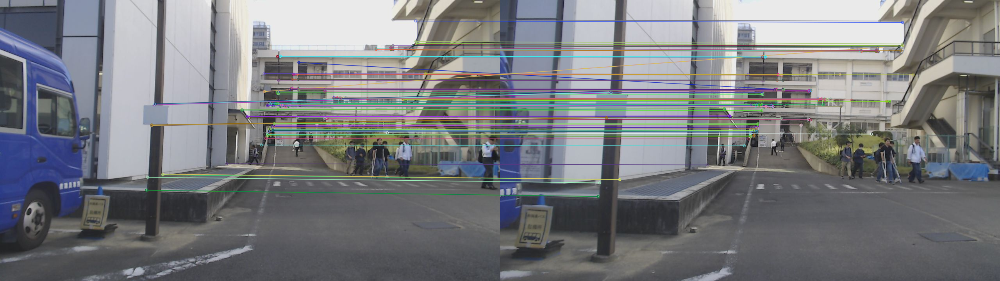

In [ ]:
detector = cv2.ORB_create()
img1 = cv2.imread("image_0.png")
img2 = cv2.imread("image_1.png")

# YOLO
source_keypoints, source_descriptor = detect_and_extract_features_yolo(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features_yolo(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_descriptor, target_descriptor)
print(f"Similarity (w/ YOLO) : {similarity} (sum: {sum} of {count})")
img_matches = cv2.drawMatches(img1, source_keypoints, img2, target_keypoints, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# No YOLO
source_keypoints, source_descriptor = detect_and_extract_features(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_descriptor, target_descriptor)
print(f"Similarity (w/o YOLO) : {similarity} (sum: {sum} of {count})")

# Viz with YOLO
cv2_imshow(img_matches)

## AKAZE (w/,w/o YOLO)


image 1/1 /content/image_0.png: 384x640 10 persons, 1 bus, 167.4ms
Speed: 2.7ms preprocess, 167.4ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict151

image 1/1 /content/image_1.png: 384x640 9 persons, 1 bus, 143.6ms
Speed: 2.5ms preprocess, 143.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict152
Similarity (w/ YOLO) : 266.31062785515417 (sum: 173101.90810585022 of 650)
Similarity (w/o YOLO) : 266.0044492056476 (sum: 173168.8964328766 of 651)


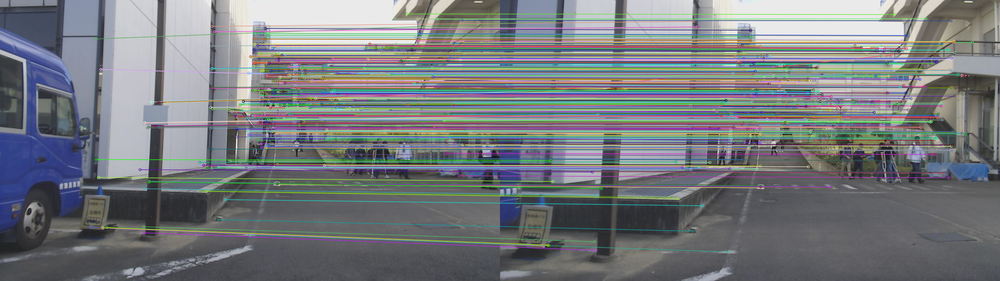

In [ ]:
detector = cv2.AKAZE_create()
img1 = cv2.imread("image_0.png")
img2 = cv2.imread("image_1.png")

# YOLO
source_keypoints, source_descriptor = detect_and_extract_features_yolo(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features_yolo(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_descriptor, target_descriptor)
print(f"Similarity (w/ YOLO) : {similarity} (sum: {sum} of {count})")
img_matches = cv2.drawMatches(img1, source_keypoints, img2, target_keypoints, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# No YOLO
source_keypoints, source_descriptor = detect_and_extract_features(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_descriptor, target_descriptor)
print(f"Similarity (w/o YOLO) : {similarity} (sum: {sum} of {count})")

# Viz with YOLO
cv2_imshow(img_matches)

# FLANN

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

def detect_and_extract_features_yolo(detector, img_path):
  # YOLO
  model = YOLO("yolov8n.pt")
  results = model.predict(source=img_path, save=True)

  # mask
  img = cv2.imread(img_path)
  mask = np.full(img.shape[:2], 255, dtype=np.uint8)
  for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0])
    mask[y1:y2, x1:x2] = 0

  # extraction
  keypoints, descriptors = detector.detectAndCompute(img, mask)

  return keypoints, descriptors

def detect_and_extract_features(detector, img_path):
  img = cv2.imread(img_path)
  keypoints, descriptors = detector.detectAndCompute(img, None)

  return keypoints, descriptors

def calc_similarity(descriptor1, descriptor2):
  FLANN_INDEX_LSH = 6
  index_params= dict(algorithm         = FLANN_INDEX_LSH,
                    table_number      = 6,
                    key_size          = 12,
                    multi_probe_level = 1)
  search_params = dict(checks = 50)
  # ANNで近傍２位までを出力
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(descriptor1, descriptor2, k = 2)
  good_matches = []
  for m, n in matches:
    if m.distance < 0.75 * n.distance:
      good_matches.append(m)
  dist = [m.distance for m in good_matches if m.distance < 0.75 * n.distance]
  return np.mean(dist), np.sum(dist), len(dist), good_matches

## ORB (w/,w/o YOLO)


image 1/1 /content/image_0.png: 384x640 10 persons, 1 bus, 166.4ms
Speed: 2.5ms preprocess, 166.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict153

image 1/1 /content/image_1.png: 384x640 9 persons, 1 bus, 169.8ms
Speed: 2.6ms preprocess, 169.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict154
Similarity (w/ YOLO) : 22.192 (sum: 5548.0 of 250)
Similarity (w/o YOLO) : 26.01762114537445 (sum: 5906.0 of 227)


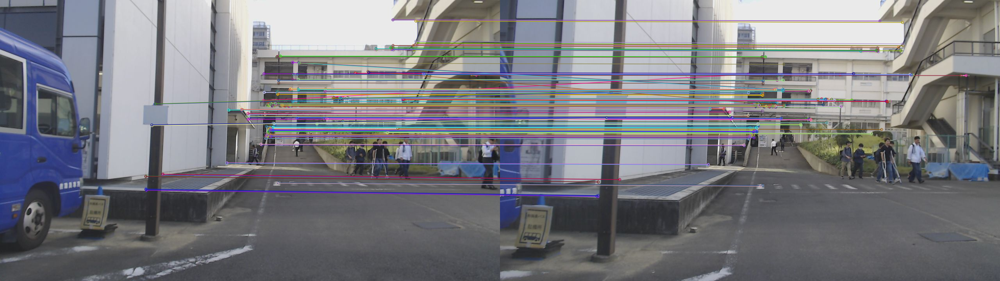

In [ ]:
detector = cv2.ORB_create()
img1 = cv2.imread("image_0.png")
img2 = cv2.imread("image_1.png")

# YOLO
source_keypoints, source_descriptor = detect_and_extract_features_yolo(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features_yolo(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_descriptor, target_descriptor)
print(f"Similarity (w/ YOLO) : {similarity} (sum: {sum} of {count})")
img_matches = cv2.drawMatches(img1, source_keypoints, img2, target_keypoints, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# No YOLO
source_keypoints, source_descriptor = detect_and_extract_features(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_descriptor, target_descriptor)
print(f"Similarity (w/o YOLO) : {similarity} (sum: {sum} of {count})")

# Viz with YOLO
cv2_imshow(img_matches)

## AKAZE (w/,w/o YOLO)


image 1/1 /content/image_0.png: 384x640 10 persons, 1 bus, 152.5ms
Speed: 4.2ms preprocess, 152.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict155

image 1/1 /content/image_1.png: 384x640 9 persons, 1 bus, 157.7ms
Speed: 2.1ms preprocess, 157.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict156
Similarity (w/ YOLO) : 34.75122549019608 (sum: 28357.0 of 816)
Similarity (w/o YOLO) : 35.07487922705314 (sum: 29042.0 of 828)


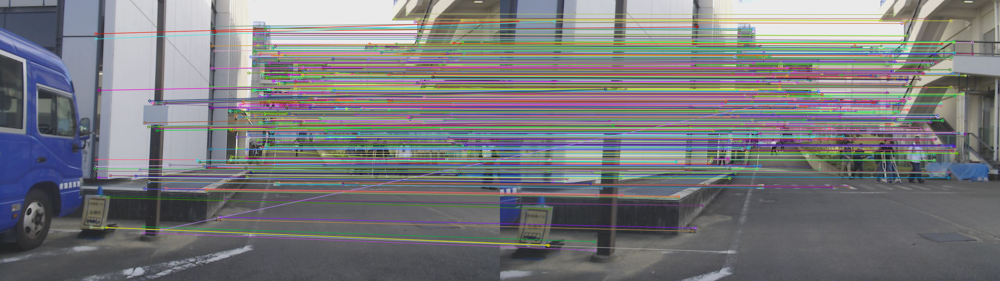

In [ ]:
detector = cv2.AKAZE_create()
img1 = cv2.imread("image_0.png")
img2 = cv2.imread("image_1.png")

# YOLO
source_keypoints, source_descriptor = detect_and_extract_features_yolo(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features_yolo(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_descriptor, target_descriptor)
print(f"Similarity (w/ YOLO) : {similarity} (sum: {sum} of {count})")
img_matches = cv2.drawMatches(img1, source_keypoints, img2, target_keypoints, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# No YOLO
source_keypoints, source_descriptor = detect_and_extract_features(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_descriptor, target_descriptor)
print(f"Similarity (w/o YOLO) : {similarity} (sum: {sum} of {count})")

# Viz with YOLO
cv2_imshow(img_matches)

# FLANN with RANSAC (Homograph)

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

def detect_and_extract_features_yolo(detector, img_path):
  # YOLO
  model = YOLO("yolov8n.pt")
  results = model.predict(source=img_path, save=True)

  # mask
  img = cv2.imread(img_path)
  mask = np.full(img.shape[:2], 255, dtype=np.uint8)
  for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0])
    mask[y1:y2, x1:x2] = 0

  # extraction
  keypoints, descriptors = detector.detectAndCompute(img, mask)

  return keypoints, descriptors

def detect_and_extract_features(detector, img_path):
  img = cv2.imread(img_path)
  keypoints, descriptors = detector.detectAndCompute(img, None)

  return keypoints, descriptors

def ransac_filter_matches(good_matches, kp1, kp2):
  if len(good_matches) > 4:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    matches_mask = mask.ravel().tolist()

    # RANSAC後の良いマッチを選択
    ransac_matches = [good_matches[i] for i in range(len(good_matches)) if matches_mask[i]]
  else:
    ransac_matches = good_matches

  return ransac_matches

def calc_similarity(kp1, des1, kp2, des2):
  FLANN_INDEX_LSH = 6
  index_params= dict(algorithm         = FLANN_INDEX_LSH,
                    table_number      = 6,
                    key_size          = 12,
                    multi_probe_level = 1)
  search_params = dict(checks = 50)
  # ANNで近傍２位までを出力
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des1, des2, k = 2)
  good_matches = []
  for m, n in matches:
    if m.distance < 0.75 * n.distance:
      good_matches.append(m)
  ransac_matches = ransac_filter_matches(good_matches, kp1, kp2)
  dist = [m.distance for m in ransac_matches]
  return np.mean(dist), np.sum(dist), len(dist), ransac_matches

## ORB (w/,w/o YOLO)


image 1/1 /content/image_0.png: 384x640 10 persons, 1 bus, 164.3ms
Speed: 2.1ms preprocess, 164.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict157

image 1/1 /content/image_1.png: 384x640 9 persons, 1 bus, 145.2ms
Speed: 2.2ms preprocess, 145.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict158
Similarity (w/ YOLO) : 24.079812206572768 (sum: 5129.0 of 213)
Similarity (w/o YOLO) : 24.121387283236995 (sum: 4173.0 of 173)


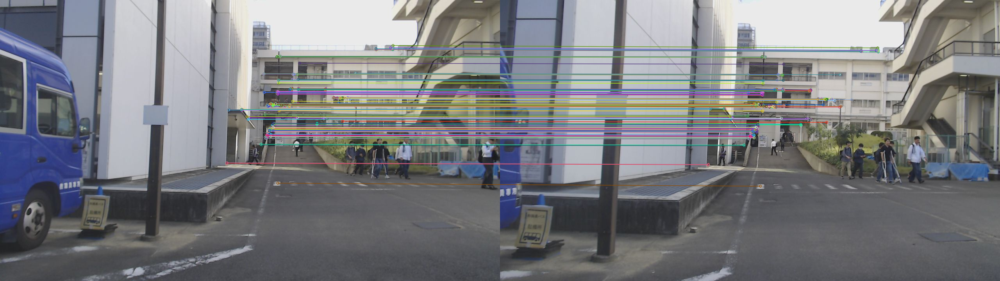

In [ ]:
detector = cv2.ORB_create()
img1 = cv2.imread("image_0.png")
img2 = cv2.imread("image_1.png")

# YOLO
source_keypoints, source_descriptor = detect_and_extract_features_yolo(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features_yolo(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_keypoints, source_descriptor, target_keypoints, target_descriptor)
print(f"Similarity (w/ YOLO) : {similarity} (sum: {sum} of {count})")
img_matches = cv2.drawMatches(img1, source_keypoints, img2, target_keypoints, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# No YOLO
source_keypoints, source_descriptor = detect_and_extract_features(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_keypoints, source_descriptor, target_keypoints, target_descriptor)
print(f"Similarity (w/o YOLO) : {similarity} (sum: {sum} of {count})")

# Viz with YOLO
cv2_imshow(img_matches)

## AKAZE (w/,w/o YOLO)


image 1/1 /content/image_0.png: 384x640 10 persons, 1 bus, 146.1ms
Speed: 2.7ms preprocess, 146.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict159

image 1/1 /content/image_1.png: 384x640 9 persons, 1 bus, 142.4ms
Speed: 2.1ms preprocess, 142.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict160
Similarity (w/ YOLO) : 30.670886075949365 (sum: 19384.0 of 632)
Similarity (w/o YOLO) : 30.42273534635879 (sum: 17128.0 of 563)


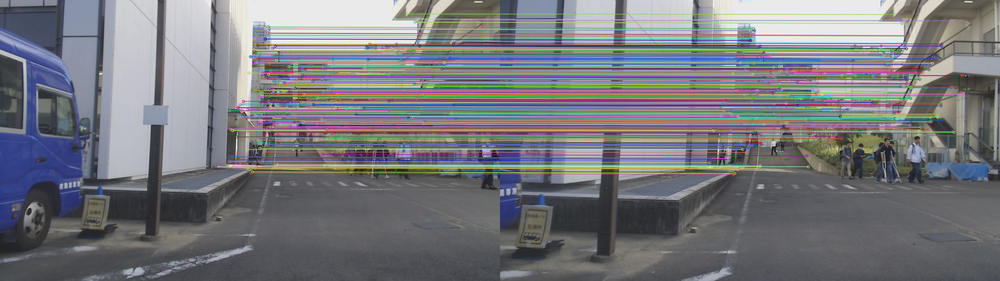

In [ ]:
detector = cv2.AKAZE_create()
img1 = cv2.imread("image_0.png")
img2 = cv2.imread("image_1.png")

# YOLO
source_keypoints, source_descriptor = detect_and_extract_features_yolo(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features_yolo(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_keypoints, source_descriptor, target_keypoints, target_descriptor)
print(f"Similarity (w/ YOLO) : {similarity} (sum: {sum} of {count})")
img_matches = cv2.drawMatches(img1, source_keypoints, img2, target_keypoints, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# No YOLO
source_keypoints, source_descriptor = detect_and_extract_features(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_keypoints, source_descriptor, target_keypoints, target_descriptor)
print(f"Similarity (w/o YOLO) : {similarity} (sum: {sum} of {count})")

# Viz with YOLO
cv2_imshow(img_matches)

# FLANN with RANSAC (Fundamental Matrix)

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

def detect_and_extract_features_yolo(detector, img_path):
  # YOLO
  model = YOLO("yolov8n.pt")
  results = model.predict(source=img_path, save=True)

  # mask
  img = cv2.imread(img_path)
  mask = np.full(img.shape[:2], 255, dtype=np.uint8)
  for box in results[0].boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0])
    mask[y1:y2, x1:x2] = 0

  # extraction
  keypoints, descriptors = detector.detectAndCompute(img, mask)

  return keypoints, descriptors

def detect_and_extract_features(detector, img_path):
  img = cv2.imread(img_path)
  keypoints, descriptors = detector.detectAndCompute(img, None)

  return keypoints, descriptors

def ransac_filter_matches(good_matches, kp1, kp2):
  if len(good_matches) > 4:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    # 基本行列をRANSACを用いて推定
    F, mask = cv2.findFundamentalMat(src_pts, dst_pts, cv2.FM_RANSAC)

    matches_mask = mask.ravel().tolist()

    # RANSAC後の良いマッチを選択
    ransac_matches = [good_matches[i] for i in range(len(good_matches)) if matches_mask[i]]
  else:
    ransac_matches = good_matches

  return ransac_matches

def calc_similarity(kp1, des1, kp2, des2):
  FLANN_INDEX_LSH = 6
  index_params= dict(algorithm         = FLANN_INDEX_LSH,
                    table_number      = 6,
                    key_size          = 12,
                    multi_probe_level = 1)
  search_params = dict(checks = 50)
  # ANNで近傍２位までを出力
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des1, des2, k = 2)
  good_matches = []
  for m, n in matches:
    if m.distance < 0.75 * n.distance:
      good_matches.append(m)
  ransac_matches = ransac_filter_matches(good_matches, kp1, kp2)
  dist = [m.distance for m in ransac_matches]
  return np.mean(dist), np.sum(dist), len(dist), ransac_matches

## ORB (w/,w/o YOLO)


image 1/1 /content/image_0.png: 384x640 10 persons, 1 bus, 167.4ms
Speed: 2.9ms preprocess, 167.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict5

image 1/1 /content/image_1.png: 384x640 9 persons, 1 bus, 207.0ms
Speed: 2.9ms preprocess, 207.0ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict6
Similarity (w/ YOLO) : 25.180392156862744 (sum: 6421.0 of 255)
Similarity (w/o YOLO) : 23.625 (sum: 4347.0 of 184)


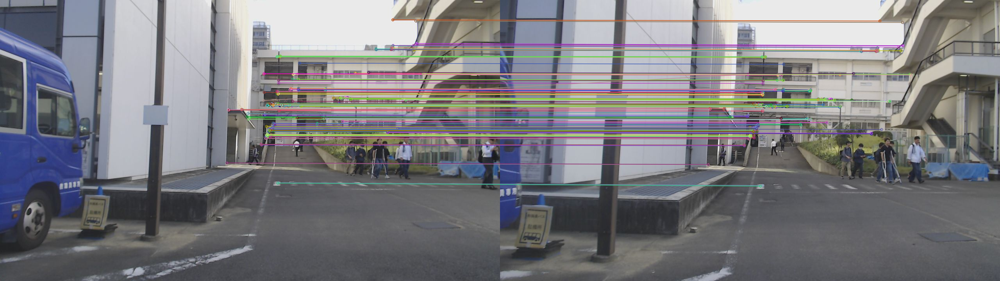

In [ ]:
detector = cv2.ORB_create()
img1 = cv2.imread("image_0.png")
img2 = cv2.imread("image_1.png")

# YOLO
source_keypoints, source_descriptor = detect_and_extract_features_yolo(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features_yolo(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_keypoints, source_descriptor, target_keypoints, target_descriptor)
print(f"Similarity (w/ YOLO) : {similarity} (sum: {sum} of {count})")
img_matches = cv2.drawMatches(img1, source_keypoints, img2, target_keypoints, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# No YOLO
source_keypoints, source_descriptor = detect_and_extract_features(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_keypoints, source_descriptor, target_keypoints, target_descriptor)
print(f"Similarity (w/o YOLO) : {similarity} (sum: {sum} of {count})")

# Viz with YOLO
cv2_imshow(img_matches)

## AKAZE (w/,w/o YOLO)


image 1/1 /content/image_0.png: 384x640 10 persons, 1 bus, 245.8ms
Speed: 3.1ms preprocess, 245.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict7

image 1/1 /content/image_1.png: 384x640 9 persons, 1 bus, 472.6ms
Speed: 14.2ms preprocess, 472.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict8
Similarity (w/ YOLO) : 32.407967032967036 (sum: 23593.0 of 728)
Similarity (w/o YOLO) : 33.76470588235294 (sum: 24108.0 of 714)


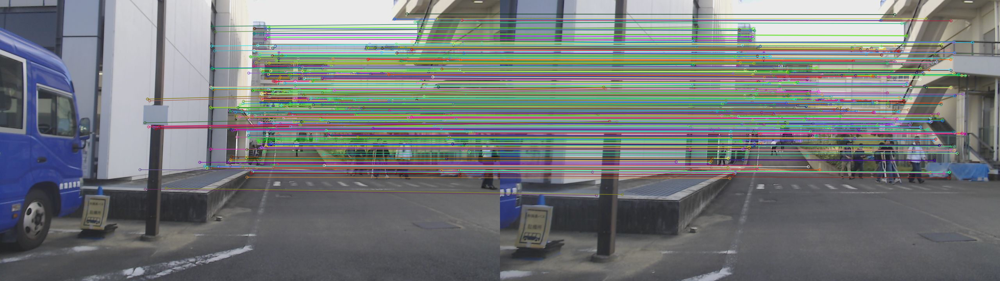

In [ ]:
detector = cv2.AKAZE_create()
img1 = cv2.imread("image_0.png")
img2 = cv2.imread("image_1.png")

# YOLO
source_keypoints, source_descriptor = detect_and_extract_features_yolo(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features_yolo(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_keypoints, source_descriptor, target_keypoints, target_descriptor)
print(f"Similarity (w/ YOLO) : {similarity} (sum: {sum} of {count})")
img_matches = cv2.drawMatches(img1, source_keypoints, img2, target_keypoints, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# No YOLO
source_keypoints, source_descriptor = detect_and_extract_features(detector, "image_0.png")
target_keypoints, target_descriptor = detect_and_extract_features(detector, "image_1.png")
similarity, sum, count, matches = calc_similarity(source_keypoints, source_descriptor, target_keypoints, target_descriptor)
print(f"Similarity (w/o YOLO) : {similarity} (sum: {sum} of {count})")

# Viz with YOLO
cv2_imshow(img_matches)